# CENG313 Introduction to Data Science
## Assignment 2 - Analyzing a Toy Covid Data: Predict Clinical Cases
## Due: January 22 by 11:59pm

## Muhammet Buğra Güler - 201180003

In [1]:
%matplotlib inline

import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

### Dataset Preparation

#### Loading Data

In [2]:
#read data from given xls ("COVID19 inpatient cases data.xls") (2nd sheet, not first sheet)
#look the first 5 records of data

In [3]:
df1 = pd.read_excel("COVID19 inpatient cases data.xls", sheet_name=1).copy()

df1.head()

,Gender,Age,Clinical classification,Days from symptoms to hospital,No comorbidity,Cardiovascular and\ncerebrovascular disease,Endocrine system disease,Malignant tumor,Respiratory system disease,Digestive system disease,Renal disease,Liver disease,Fever,Cough,Chest tightness,Fatigue,Diarrhea,Others,Clinical outcome,"Hospital stay, days"
0,Male,47,Heavy,15,Y,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,N,"Aggravated,turn to ICU",NaN
1,Female,53,Ordinary,13,Y,N,N,N,N,N,N,N,Y,Y,Y,N,N,N,Improved and discharge,6.0
2,Female,57,Ordinary,13,Y,N,N,N,N,N,N,N,Y,Y,N,N,N,N,Improved and discharge,8.0
3,Male,58,Heavy,1,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,"Aggravated,transfer to superior hospital",NaN
4,Male,54,Ordinary,10,Y,N,N,N,N,N,N,N,Y,Y,Y,N,N,N,Improved and discharge,5.0


In [4]:
# check column names, not null count and data types

In [5]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73 entries, 0 to 72
Data columns (total 20 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   Gender                                      73 non-null     object 
 1   Age                                         73 non-null     int64  
 2   Clinical classification                     73 non-null     object 
 3   Days from symptoms to hospital              73 non-null     int64  
 4   No comorbidity                              73 non-null     object 
 5   Cardiovascular and
cerebrovascular disease  73 non-null     object 
 6   Endocrine system disease                    73 non-null     object 
 7   Malignant tumor                             73 non-null     object 
 8   Respiratory system disease                  73 non-null     object 
 9   Digestive system disease                    73 non-null     object 
 10  Renal disease   

#### Dataset preprocessing

##### Datasets for FIM and Rule extraction

In [6]:
symptom_cols = ['Fever', 'Cough','Chest tightness', 'Fatigue', 'Diarrhea', 'Others']
# create df_symptoms dataframe including given columns
# add "Covid19" columns assign all entries as "Y"

In [7]:
df_symptoms = df1[symptom_cols].copy()

df_symptoms['Covid19'] = 'Y'

df_symptoms

,Fever,Cough,Chest tightness,Fatigue,Diarrhea,Others,Covid19
0,Y,Y,Y,Y,Y,N,Y
1,Y,Y,Y,N,N,N,Y
2,Y,Y,N,N,N,N,Y
3,N,N,N,N,N,N,Y
4,Y,Y,Y,N,N,N,Y
...,...,...,...,...,...,...,...
68,Y,Y,N,N,N,N,Y
69,N,Y,N,Y,N,N,Y
70,N,Y,N,N,N,N,Y
71,Y,Y,N,N,N,N,Y


In [8]:
disease_cols = ['Cardiovascular and\ncerebrovascular disease', 'Endocrine system disease','Malignant tumor','Respiratory system disease',
                'Digestive system disease','Renal disease','Liver disease']
other_cols= ['Age','Gender']
# create df_diseases dataframe consisting records of given cols(disease_cols and other_cols) from main dataframe
# add also "Clinicial classification" attribute from main dataframe calling  this column as "Illness" in your df_diseases dataframe
# add " ill" string to all records in "illness" attribute

In [9]:
df_diseases = df1[disease_cols + other_cols].copy()

df_diseases['Illness'] = df1['Clinical classification'] + ' ill' 

df_diseases

,Cardiovascular and\ncerebrovascular disease,Endocrine system disease,Malignant tumor,Respiratory system disease,Digestive system disease,Renal disease,Liver disease,Age,Gender,Illness
0,N,N,N,N,N,N,N,47,Male,Heavy ill
1,N,N,N,N,N,N,N,53,Female,Ordinary ill
2,N,N,N,N,N,N,N,57,Female,Ordinary ill
3,N,Y,N,N,N,N,N,58,Male,Heavy ill
4,N,N,N,N,N,N,N,54,Male,Ordinary ill
...,...,...,...,...,...,...,...,...,...,...
68,N,N,N,N,N,N,N,30,Female,Ordinary ill
69,N,Y,N,N,N,N,N,59,Female,Ordinary ill
70,Y,N,N,N,N,N,N,87,Female,Ordinary ill
71,Y,N,N,N,N,N,N,56,Female,Ordinary ill


In [10]:
# categorize ages as "Elderly" (Age>=65),
#                    "Adults" (18<= Age <65),
#                    "Teens" (12=<Age<18),
#                    "Children" (1<Age<11),
#                    "Infants" (Age<=1)
# in new column "Age Group", drop "Age" column in df_disease dataframe.

In [11]:
df_diseases['Age Group'] = pd.cut(df_diseases['Age'],
                                  bins=[0, 1, 11, 18, 65, float('inf')],
                                  labels=['Infants', 'Children', 'Teens', 'Adults', 'Elderly'],
                                  right=False)

df_diseases.drop(columns=['Age'], inplace=True)

df_diseases

,Cardiovascular and\ncerebrovascular disease,Endocrine system disease,Malignant tumor,Respiratory system disease,Digestive system disease,Renal disease,Liver disease,Gender,Illness,Age Group
0,N,N,N,N,N,N,N,Male,Heavy ill,Adults
1,N,N,N,N,N,N,N,Female,Ordinary ill,Adults
2,N,N,N,N,N,N,N,Female,Ordinary ill,Adults
3,N,Y,N,N,N,N,N,Male,Heavy ill,Adults
4,N,N,N,N,N,N,N,Male,Ordinary ill,Adults
...,...,...,...,...,...,...,...,...,...,...
68,N,N,N,N,N,N,N,Female,Ordinary ill,Adults
69,N,Y,N,N,N,N,N,Female,Ordinary ill,Adults
70,Y,N,N,N,N,N,N,Female,Ordinary ill,Elderly
71,Y,N,N,N,N,N,N,Female,Ordinary ill,Adults


In [12]:
# Convert "Gender", "Illness", "Age Group" attributes to dummies for one-hot encoding, then drop these attributes from df_diseases

In [13]:
df_diseases = pd.get_dummies(df_diseases, columns=['Gender', 'Illness', 'Age Group'], drop_first=True)

df_diseases

,Cardiovascular and\ncerebrovascular disease,Endocrine system disease,Malignant tumor,Respiratory system disease,Digestive system disease,Renal disease,Liver disease,Gender_Male,Illness_Ordinary ill,Age Group_Children,Age Group_Teens,Age Group_Adults,Age Group_Elderly
0,N,N,N,N,N,N,N,1,0,0,0,1,0
1,N,N,N,N,N,N,N,0,1,0,0,1,0
2,N,N,N,N,N,N,N,0,1,0,0,1,0
3,N,Y,N,N,N,N,N,1,0,0,0,1,0
4,N,N,N,N,N,N,N,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,N,N,N,N,N,N,N,0,1,0,0,1,0
69,N,Y,N,N,N,N,N,0,1,0,0,1,0
70,Y,N,N,N,N,N,N,0,1,0,0,0,1
71,Y,N,N,N,N,N,N,0,1,0,0,1,0


In [14]:
# convert all data to bool (True or False) (by replacing or mapping attribute values ) for df_symptoms dataframe

In [15]:
for column in df_symptoms.columns:
    df_symptoms[column] = df_symptoms[column].apply(lambda x: True if x == 'Y' else False)
    
df_symptoms

,Fever,Cough,Chest tightness,Fatigue,Diarrhea,Others,Covid19
0,True,True,True,True,True,False,True
1,True,True,True,False,False,False,True
2,True,True,False,False,False,False,True
3,False,False,False,False,False,False,True
4,True,True,True,False,False,False,True
...,...,...,...,...,...,...,...
68,True,True,False,False,False,False,True
69,False,True,False,True,False,False,True
70,False,True,False,False,False,False,True
71,True,True,False,False,False,False,True


In [16]:
# same for df_diseases dataframe

In [17]:
for column in df_diseases.columns:
    df_diseases[column] = df_diseases[column].apply(lambda x: True if x == 'Y' or x == 1 else False)
    
df_diseases

,Cardiovascular and\ncerebrovascular disease,Endocrine system disease,Malignant tumor,Respiratory system disease,Digestive system disease,Renal disease,Liver disease,Gender_Male,Illness_Ordinary ill,Age Group_Children,Age Group_Teens,Age Group_Adults,Age Group_Elderly
0,False,False,False,False,False,False,False,True,False,False,False,True,False
1,False,False,False,False,False,False,False,False,True,False,False,True,False
2,False,False,False,False,False,False,False,False,True,False,False,True,False
3,False,True,False,False,False,False,False,True,False,False,False,True,False
4,False,False,False,False,False,False,False,True,True,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,False,False,False,False,False,False,False,False,True,False,False,True,False
69,False,True,False,False,False,False,False,False,True,False,False,True,False
70,True,False,False,False,False,False,False,False,True,False,False,False,True
71,True,False,False,False,False,False,False,False,True,False,False,True,False


In [18]:
# install mlxtend library

In [19]:
!pip install mlxtend

In [20]:
# create "df_symptoms_extended" concatanating df_symptoms with df_diseases dummy attributes of "Gender", "Illness", "Age Group" and their records.
# drop "Covid19" attribute in extended dataframe

In [21]:
df_symptoms_extended = pd.concat([df_symptoms, df_diseases[['Gender_Male', 'Illness_Ordinary ill', 'Age Group_Children', 'Age Group_Teens', 'Age Group_Adults', 'Age Group_Elderly']]], axis=1)

df_symptoms_extended = df_symptoms_extended.drop(columns=['Covid19'])

df_symptoms_extended

,Fever,Cough,Chest tightness,Fatigue,Diarrhea,Others,Gender_Male,Illness_Ordinary ill,Age Group_Children,Age Group_Teens,Age Group_Adults,Age Group_Elderly
0,True,True,True,True,True,False,True,False,False,False,True,False
1,True,True,True,False,False,False,False,True,False,False,True,False
2,True,True,False,False,False,False,False,True,False,False,True,False
3,False,False,False,False,False,False,True,False,False,False,True,False
4,True,True,True,False,False,False,True,True,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...
68,True,True,False,False,False,False,False,True,False,False,True,False
69,False,True,False,True,False,False,False,True,False,False,True,False
70,False,True,False,False,False,False,False,True,False,False,False,True
71,True,True,False,False,False,False,False,True,False,False,True,False


#### Fill mising values with KNN

The usage of KNNImputer is not allowed.

In [22]:
# show missing record as (number of missings/total) (should be only "Hospital stay, days")

In [23]:
missing_records = df1['Hospital stay, days'].isnull().sum()

total_records = len(df1)

print(f"Missing records: {missing_records}/{total_records} ({missing_records/total_records:.2%})")

Missing records: 4/73 (5.48%)


In [24]:
# copy dataframe df1 to df2
# convert bools and strings to numeric attributes ('Male':1, 'Female':2, 'Heavy':1, 'Ordinary':2, 'Y':1, 'N':0)

In [25]:
df2 = df1.copy()

df2.replace({'Male': 1, 'Female': 2, 'Heavy': 1, 'Ordinary': 2, 'Y': 1, 'N': 0}, inplace=True)

df2

,Gender,Age,Clinical classification,Days from symptoms to hospital,No comorbidity,Cardiovascular and\ncerebrovascular disease,Endocrine system disease,Malignant tumor,Respiratory system disease,Digestive system disease,Renal disease,Liver disease,Fever,Cough,Chest tightness,Fatigue,Diarrhea,Others,Clinical outcome,"Hospital stay, days"
0,1,47,1,15,1,0,0,0,0,0,0,0,1,1,1,1,1,0,"Aggravated,turn to ICU",NaN
1,2,53,2,13,1,0,0,0,0,0,0,0,1,1,1,0,0,0,Improved and discharge,6.0
2,2,57,2,13,1,0,0,0,0,0,0,0,1,1,0,0,0,0,Improved and discharge,8.0
3,1,58,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,"Aggravated,transfer to superior hospital",NaN
4,1,54,2,10,1,0,0,0,0,0,0,0,1,1,1,0,0,0,Improved and discharge,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,2,30,2,13,1,0,0,0,0,0,0,0,1,1,0,0,0,0,Improved and discharge,24.0
69,2,59,2,10,0,0,1,0,0,0,0,0,0,1,0,1,0,0,Improved and discharge,16.0
70,2,87,2,10,0,1,0,0,0,0,0,0,0,1,0,0,0,0,Improved and discharge,14.0
71,2,56,2,20,0,1,0,0,0,0,0,0,1,1,0,0,0,0,Improved and discharge,12.0


In [26]:
# min_max_scale for scaling missing atttribute (you will need for "nan" values)

# scale other nonmissing attributes using MinMaxScaler in sklearn

# fill missing values based on KNeighborsRegressor regression in sklearn (for k=7)

# don't forget to convert original range

# fill df1 missings with given values

In [27]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import MinMaxScaler

df2.drop(columns=["Clinical outcome"], inplace=True) # because it is str type

def min_max_scale(df): # min_max_scale for scaling missing atttribute (you will need for "nan" values)
    scaler = MinMaxScaler()
    non_missing_cols = df2.columns[df2.notna().all()]
    df[non_missing_cols] = scaler.fit_transform(df[non_missing_cols]) # scale other nonmissing attributes using MinMaxScaler in sklearn
    return df, scaler, non_missing_cols

df_scaled, scaler, non_missing_cols = min_max_scale(df2)

df_scaled

,Gender,Age,Clinical classification,Days from symptoms to hospital,No comorbidity,Cardiovascular and\ncerebrovascular disease,Endocrine system disease,Malignant tumor,Respiratory system disease,Digestive system disease,Renal disease,Liver disease,Fever,Cough,Chest tightness,Fatigue,Diarrhea,Others,"Hospital stay, days"
0,0.0,0.393939,0.0,0.358974,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,NaN
1,1.0,0.484848,1.0,0.307692,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,6.0
2,1.0,0.545455,1.0,0.307692,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,8.0
3,0.0,0.560606,0.0,0.000000,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
4,0.0,0.500000,1.0,0.230769,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,1.0,0.136364,1.0,0.307692,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,24.0
69,1.0,0.575758,1.0,0.230769,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,16.0
70,1.0,1.000000,1.0,0.230769,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,14.0
71,1.0,0.530303,1.0,0.487179,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,12.0


In [28]:
def fill_missing_knn(df, k=7): # fill missing values based on KNeighborsRegressor regression in sklearn (for k=7)
    missing_cols = df.columns[df.isna().any()]
    for col in missing_cols:
        X_train = df[df[col].notna()][non_missing_cols]
        y_train = df[df[col].notna()][col]
        
        knn_model = KNeighborsRegressor(n_neighbors=k)
        knn_model.fit(X_train, y_train)
        
        X_missing = df[df[col].isna()][non_missing_cols] # missing values
        y_pred = knn_model.predict(X_missing) # Predict classes for missing data
        
        df.loc[df[col].isna(), col] = y_pred
        df1.loc[df1[col].isna(), col] = y_pred # fill df1 missings with given values 
    
    return df

df_filled_knn = fill_missing_knn(df_scaled, k=7)

df_filled_knn

,Gender,Age,Clinical classification,Days from symptoms to hospital,No comorbidity,Cardiovascular and\ncerebrovascular disease,Endocrine system disease,Malignant tumor,Respiratory system disease,Digestive system disease,Renal disease,Liver disease,Fever,Cough,Chest tightness,Fatigue,Diarrhea,Others,"Hospital stay, days"
0,0.0,0.393939,0.0,0.358974,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,14.285714
1,1.0,0.484848,1.0,0.307692,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,6.000000
2,1.0,0.545455,1.0,0.307692,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,8.000000
3,0.0,0.560606,0.0,0.000000,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.857143
4,0.0,0.500000,1.0,0.230769,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,5.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,1.0,0.136364,1.0,0.307692,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,24.000000
69,1.0,0.575758,1.0,0.230769,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,16.000000
70,1.0,1.000000,1.0,0.230769,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,14.000000
71,1.0,0.530303,1.0,0.487179,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,12.000000


In [29]:
def inv_min_max_scale(df, scaler, scaled_cols): # convert original range
    df[scaled_cols] = scaler.inverse_transform(df[scaled_cols])
    return df

df2 = inv_min_max_scale(df2, scaler, non_missing_cols)

df2

,Gender,Age,Clinical classification,Days from symptoms to hospital,No comorbidity,Cardiovascular and\ncerebrovascular disease,Endocrine system disease,Malignant tumor,Respiratory system disease,Digestive system disease,Renal disease,Liver disease,Fever,Cough,Chest tightness,Fatigue,Diarrhea,Others,"Hospital stay, days"
0,1.0,47.0,1.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,14.285714
1,2.0,53.0,2.0,13.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,6.000000
2,2.0,57.0,2.0,13.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,8.000000
3,1.0,58.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.857143
4,1.0,54.0,2.0,10.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,5.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,2.0,30.0,2.0,13.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,24.000000
69,2.0,59.0,2.0,10.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,16.000000
70,2.0,87.0,2.0,10.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,14.000000
71,2.0,56.0,2.0,20.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,12.000000


#### Dataset for classification task

In [30]:
# copy df1 to data_df datafarme
# split data: label attribute 'Clinical classification' as Y, features as X (including nonmissing features)
# convert attribute values to 0 and 1 ('Y':1, 'N':0, 'Male':0, "Female":1)

In [31]:
data_df = df2.copy() # copy df2 to data_df datafarme. Because it needs number values.

data_df.replace({'Y': 1, 'N': 0, 'Male': 0, 'Female': 1}, inplace=True)

Y = data_df['Clinical classification']
X = data_df.drop('Clinical classification', axis=1)

data_df

,Gender,Age,Clinical classification,Days from symptoms to hospital,No comorbidity,Cardiovascular and\ncerebrovascular disease,Endocrine system disease,Malignant tumor,Respiratory system disease,Digestive system disease,Renal disease,Liver disease,Fever,Cough,Chest tightness,Fatigue,Diarrhea,Others,"Hospital stay, days"
0,1.0,47.0,1.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,14.285714
1,2.0,53.0,2.0,13.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,6.000000
2,2.0,57.0,2.0,13.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,8.000000
3,1.0,58.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.857143
4,1.0,54.0,2.0,10.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,5.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,2.0,30.0,2.0,13.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,24.000000
69,2.0,59.0,2.0,10.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,16.000000
70,2.0,87.0,2.0,10.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,14.000000
71,2.0,56.0,2.0,20.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,12.000000


In [32]:
# Split dataset as train and test set using sklearn (for random_state=44)
# x_train, x_val, y_test, y_test = # to-do

In [33]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=44) # Split dataset as train and test set using sklearn (for random_state=44)
x_val, x_test, y_val, y_test = train_test_split(x_test, y_test, test_size=0.5, random_state=44)

print(f"Train Set (x_train): {x_train.shape}")
print(f"\nValidation Set (x_val): {x_val.shape}")
print(f"\nTest Set (x_test): {x_test.shape}")
print(f"\nTrain Set Label (y_train): {y_train.shape}")
print(f"\nValidation Set Label (y_val): {y_val.shape}")
print(f"\nTest Set Label (y_test): {y_test.shape}")

Train Set (x_train): (58, 18)

Validation Set (x_val): (7, 18)

Test Set (x_test): (8, 18)

Train Set Label (y_train): (58,)

Validation Set Label (y_val): (7,)

Test Set Label (y_test): (8,)


### Classification Part: Predicting Clinical Cases

#### Decision Tree Classifier

In [34]:
# create ID3 Tree using sklearn

# train Decision Tree Classifier

# Predict classes for test data

# calculate accuracy, error, recall, precision, sensitivity, specifity, f1 measure, confusion matrix based on your defined functions

In [35]:
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, precision_score, f1_score 

# convert numpy array
x_train_np = np.array(x_train) 
y_train_np = np.array(y_train)
x_test_np = np.array(x_test)

# create ID3 Tree using sklearn
dt_classifier = DecisionTreeClassifier(criterion='entropy', random_state=44) # train Decision Tree Classifier
dt_classifier.fit(x_train_np, y_train_np)
y_pred_dt = dt_classifier.predict(x_test_np) # Predict classes for test data

# calculate accuracy, error, recall, precision, sensitivity, specifity, f1 measure, confusion matrix based on your defined functions
accuracy = accuracy_score(y_test, y_pred_dt)
error = 1 - accuracy
recall = recall_score(y_test, y_pred_dt)
precision = precision_score(y_test, y_pred_dt)
f1 = f1_score(y_test, y_pred_dt)
conf_matrix = confusion_matrix(y_test, y_pred_dt)
sensitivity = recall # same with recall
specificity = conf_matrix[0, 0] / (conf_matrix[0, 0] + conf_matrix[0, 1])

# print accuracy, error, recall, precision, sensitivity, specifity, f1 measure, confusion matrix based on your defined functions
print("Accuracy:", accuracy)
print("Error:", error)
print("Recall:", recall)
print("Precision:", precision)
print("Sensitivity:", sensitivity)
print("Specificity:", specificity)
print("F1 Score:", f1)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.625
Error: 0.375
Recall: 0.3333333333333333
Precision: 0.5
Sensitivity: 0.3333333333333333
Specificity: 0.3333333333333333
F1 Score: 0.4
Confusion Matrix:
[[1 2]
 [1 4]]


In [36]:
# visualize your tree using plot_tree inside sklearn and dtreeplt
# !pip install dtreeplt

In [37]:
!pip install dtreeplt

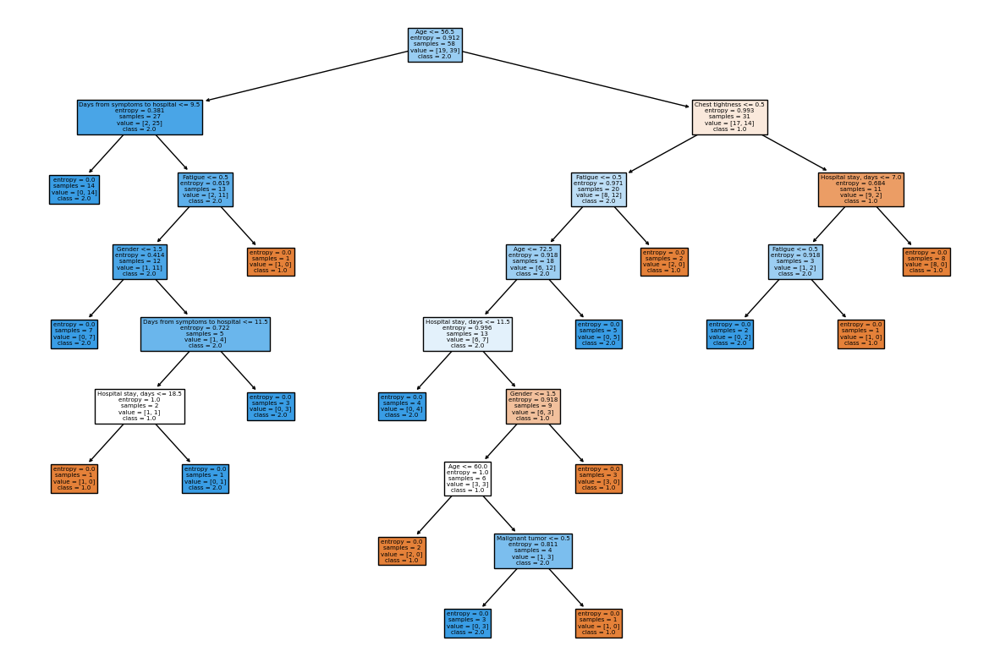

In [38]:
from sklearn.tree import plot_tree

plt.figure(figsize=(15, 10)) # visualize your tree using plot_tree inside sklearn
plot_tree(dt_classifier, filled=True, feature_names=X.columns.tolist(), class_names=list(map(str, dt_classifier.classes_)))
plt.show()

In [39]:
#from dtreeplt import dtreeplt # visualize your tree using plot_tree inside dtreeplt

#dtree = dtreeplt(model=dt_classifier, feature_names=X.columns, target_names=['0', '1'])
#fig = dtree.view()
#fig.show()

# !!!! TypeError: Axes.annotate() missing 1 required positional argument: 'text'. That's why I put the code in the comment line !!!!

#### KNN Classifier

In [40]:
# classify test data with KNN classifier of sklearn (for each possible k value)

# calculate accuracy, error, recall, precision, sensitivity, specifity, f1 measure, confusion matrix based on your defined functions (using k=7)

# plot test errors for each k

In [41]:
from sklearn.neighbors import KNeighborsClassifier

k_values = [1, 3, 5, 7, 9] # random k values

for k in k_values: # classify test data with KNN classifier of sklearn (for each possible k value)
    knn_classifier = KNeighborsClassifier(n_neighbors=k)
    knn_classifier.fit(x_train_np, y_train_np)
    y_pred_knn = knn_classifier.predict(x_test_np) # Predict classes for test data
    print(f"K={k} Classification results:\n{y_pred_knn}")
    
    accuracy = accuracy_score(y_test, y_pred_knn) # plot test errors for each k
    print(f"Error: {1 - accuracy}\n")

K=1 Classification results:
[1. 1. 2. 2. 2. 1. 2. 2.]
Error: 0.5

K=3 Classification results:
[2. 1. 2. 2. 2. 1. 2. 2.]
Error: 0.375

K=5 Classification results:
[2. 1. 2. 2. 2. 2. 2. 2.]
Error: 0.5

K=7 Classification results:
[2. 1. 2. 2. 1. 1. 2. 2.]
Error: 0.25

K=9 Classification results:
[2. 1. 2. 2. 2. 1. 2. 2.]
Error: 0.375



In [42]:
k_value = 7

knn_classifier = KNeighborsClassifier(n_neighbors=k_value)
knn_classifier.fit(x_train_np, y_train_np)

y_pred_knn = knn_classifier.predict(x_test_np) # Predict classes for test data

# calculate accuracy, error, recall, precision, sensitivity, specifity, f1 measure, confusion matrix based on your defined functions (using k=7)
accuracy = accuracy_score(y_test, y_pred_knn)
precision = precision_score(y_test, y_pred_knn)
recall = recall_score(y_test, y_pred_knn)
f1 = f1_score(y_test, y_pred_knn)
conf_matrix = confusion_matrix(y_test, y_pred_knn)
sensitivity = recall # same with recall
specificity = conf_matrix[0, 0] / (conf_matrix[0, 0] + conf_matrix[0, 1])

# print accuracy, error, recall, precision, sensitivity, specifity, f1 measure, confusion matrix based on your defined functions (using k=7)
print(f"K={k_value}:")
print(f"Accuracy: {accuracy}")
print(f"Error: {1 - accuracy}")
print(f"Precision: {precision}")
print(f"Sensitivity: {sensitivity}")
print(f"Specificity: {specificity}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(f"Confusion Matrix:\n{conf_matrix}\n")

K=7:
Accuracy: 0.75
Error: 0.25
Precision: 0.6666666666666666
Sensitivity: 0.6666666666666666
Specificity: 0.6666666666666666
Recall: 0.6666666666666666
F1 Score: 0.6666666666666666
Confusion Matrix:
[[2 1]
 [1 4]]



### Evaluation Part: Decision Boundries, ROC Curves, Performance Comparisons

In [43]:
# draw ROC curves for each classifier

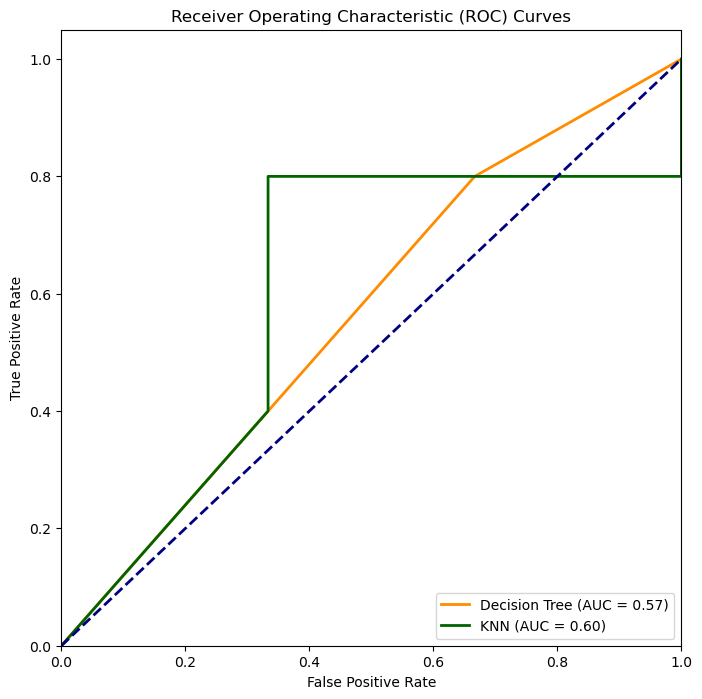

In [44]:
from sklearn.metrics import roc_curve, auc

# Clinical classification label convert 0,1
y_test_binary = (y_test == 2).astype(int)

# Decision Tree ROC Curve
y_probs_dt = dt_classifier.predict_proba(x_test_np)[:, 1]
fpr_dt, tpr_dt, _ = roc_curve(y_test_binary, y_probs_dt)
roc_auc_dt = auc(fpr_dt, tpr_dt)

# K-Nearest Neighbors ROC Curve
y_probs_knn = knn_classifier.predict_proba(x_test_np)[:, 1]
fpr_knn, tpr_knn, _ = roc_curve(y_test_binary, y_probs_knn)
roc_auc_knn = auc(fpr_knn, tpr_knn)

# ROC Curves Plot
plt.figure(figsize=(8, 8))
plt.plot(fpr_dt, tpr_dt, color='darkorange', lw=2, label=f'Decision Tree (AUC = {roc_auc_dt:.2f})')
plt.plot(fpr_knn, tpr_knn, color='darkgreen', lw=2, label=f'KNN (AUC = {roc_auc_knn:.2f})')

# print plot
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc="lower right")
plt.show()

In [45]:
# show decision boundaries for each classifiers on same plot (show pairwise since we have more than 2 attiributes)

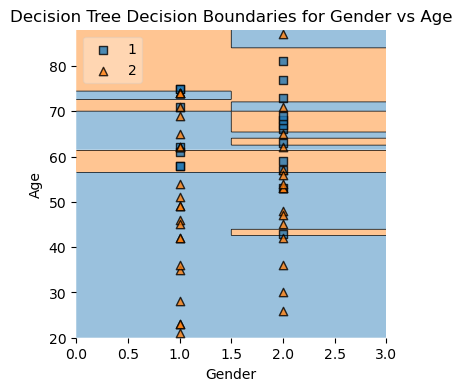

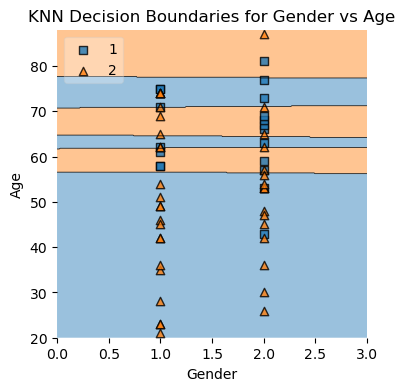

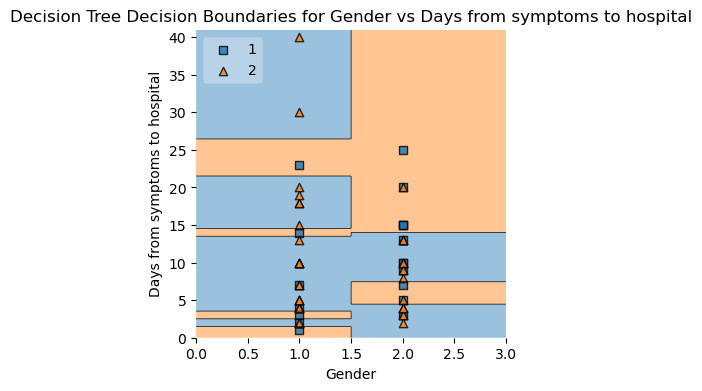

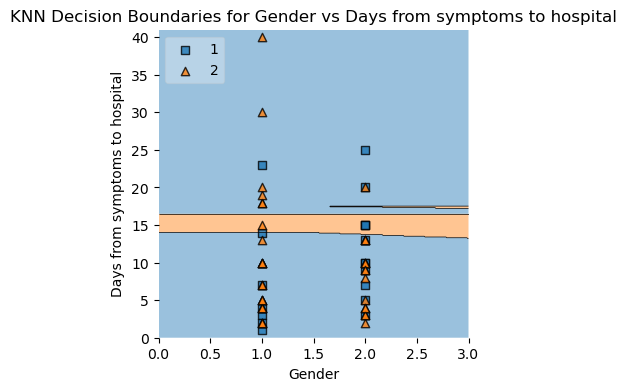

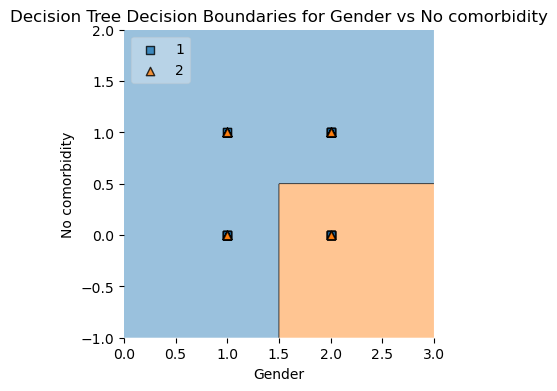

...

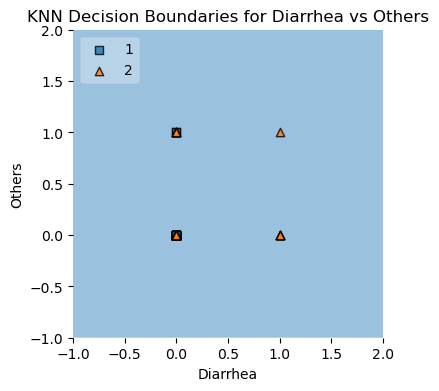

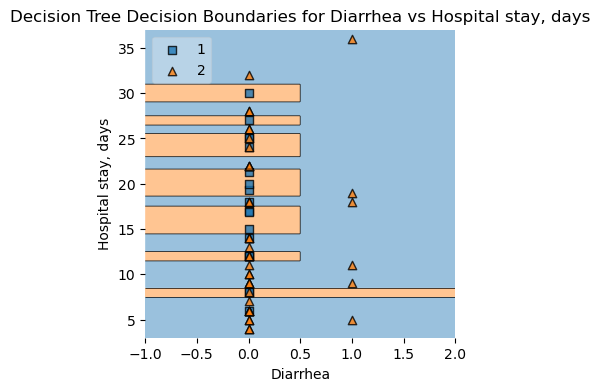

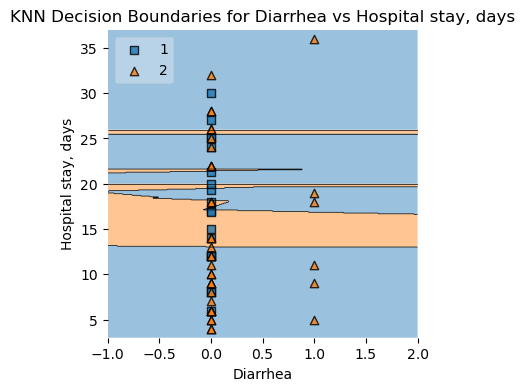

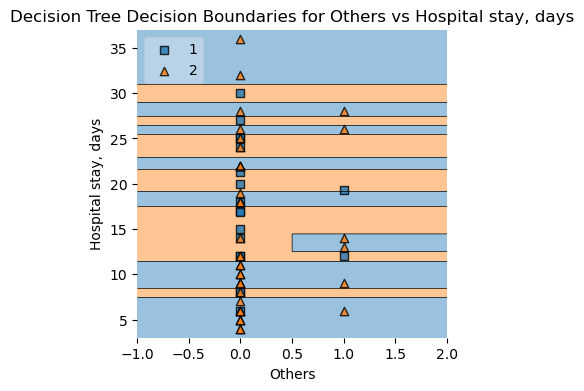

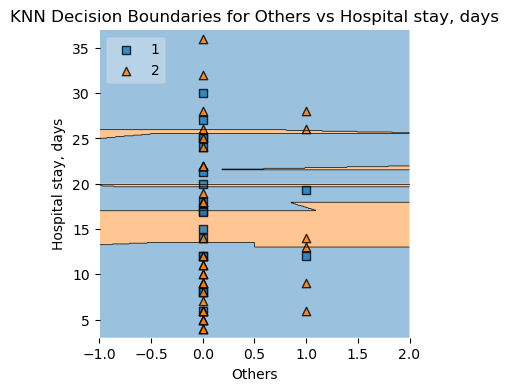

In [46]:
from itertools import combinations
from mlxtend.plotting import plot_decision_regions

y_train = y_train.astype(int) # y convert to int for plot
feature_combinations = list(combinations(X.columns, 2))

for features in feature_combinations: # show decision boundaries for each classifiers on same plot (show pairwise since we have more than 2 attiributes)
    feature1, feature2 = features

    # Decision Tree
    dt_classifier.fit(x_train[list(features)].to_numpy(), y_train)
    plt.figure(figsize=(4, 4))
    plot_decision_regions(X=x_train[list(features)].to_numpy(), y=y_train.to_numpy(), clf=dt_classifier, legend=2)
    plt.title(f"Decision Tree Decision Boundaries for {feature1} vs {feature2}")
    plt.xlabel(feature1)
    plt.ylabel(feature2)
    plt.show()

    # KNN
    knn_classifier.fit(x_train[list(features)].to_numpy(), y_train)
    plt.figure(figsize=(4, 4))
    plot_decision_regions(X=x_train[list(features)].to_numpy(), y=y_train.to_numpy(), clf=knn_classifier, legend=2)
    plt.title(f"KNN Decision Boundaries for {feature1} vs {feature2}")
    plt.xlabel(feature1)
    plt.ylabel(feature2)  
    plt.show()

In [47]:
# show classification results based on all measures (acc,err,recall, specifity, etc.) inside a table.

In [48]:
# Decision Tree metrics
conf_matrix_dt = confusion_matrix(y_test, y_pred_dt)
metrics_dt = {
    'Model': 'Decision Tree',
    'Accuracy': accuracy_score(y_test, y_pred_dt),
    'Error': 1 - accuracy_score(y_test, y_pred_dt),
    'Recall': recall_score(y_test, y_pred_dt),
    'Sensitivity': recall_score(y_test, y_pred_dt),
    'Specificity': conf_matrix_dt[0, 0] / (conf_matrix_dt[0, 0] + conf_matrix_dt[0, 1]),
    'Precision': precision_score(y_test, y_pred_dt),
    'F1 Score': f1_score(y_test, y_pred_dt),
    'Confusion Matrix': conf_matrix_dt.tolist()
}

# K-Nearest Neighbors metrics
conf_matrix_knn = confusion_matrix(y_test, y_pred_knn)
metrics_knn = {
    'Model': 'K-Nearest Neighbors',
    'Accuracy': accuracy_score(y_test, y_pred_knn),
    'Error': 1 - accuracy_score(y_test, y_pred_knn),
    'Recall': recall_score(y_test, y_pred_knn),
    'Sensitivity': recall_score(y_test, y_pred_knn),
    'Specificity': conf_matrix_knn[0, 0] / (conf_matrix_knn[0, 0] + conf_matrix_knn[0, 1]),
    'Precision': precision_score(y_test, y_pred_knn),
    'F1 Score': f1_score(y_test, y_pred_knn),
    'Confusion Matrix': conf_matrix_knn.tolist()
}

results_df = pd.DataFrame([metrics_dt, metrics_knn])

results_df

,Model,Accuracy,Error,Recall,Sensitivity,Specificity,Precision,F1 Score,Confusion Matrix
0,Decision Tree,0.625,0.375,0.333333,0.333333,0.333333,0.500000,0.400000,"[[1, 2], [1, 4]]"
1,K-Nearest Neighbors,0.750,0.250,0.666667,0.666667,0.666667,0.666667,0.666667,"[[2, 1], [1, 4]]"
